# Twitter Analysis

**Import Library**

In [1]:
import numpy as np
import pandas as pd
import re

from wordcloud import WordCloud
import nltk
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

**Load Dataset**

In [2]:
raw_data = pd.read_csv("./data/tweet_tentang_lapor_dari_september2018.csv")

raw_data

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,quote_url,video,near,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date
0,1178354284443758592,1178354284443758592,1569776528000,2019-09-30,00:02:08,WIB,712161361657114626,hengunawan0108,Agustinus Hendra Gunawan,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '712161361657114626', 'username':...",NaN
1,1178322545507885056,1178322545507885056,1569768961000,2019-09-29,21:56:01,WIB,1686118026,aselimandiri,pencari_keadilan,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1686118026', 'username': 'aselim...",NaN
2,1178187118566244352,1178187118566244352,1569736673000,2019-09-29,12:57:53,WIB,1165178906095181824,purwantopomah01,Purwanto,NaN,...,https://twitter.com/PurwantoPomah01/status/117...,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1165178906095181824', 'username'...",NaN
3,1178187049079230464,1176504815209209856,1569736656000,2019-09-29,12:57:36,WIB,108215168,hafizpea,Hafiz Furqonul Aziz,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '108215168', 'username': 'hafizpe...",NaN
4,1178186289805287425,1176504815209209856,1569736475000,2019-09-29,12:54:35,WIB,108215168,hafizpea,Hafiz Furqonul Aziz,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '108215168', 'username': 'hafizpe...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7617,1040077777385353216,1039437502287773696,1536808840000,2018-09-13,10:20:40,WIB,1017467821268189184,wastedaccount3,Durjana,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1017467821268189184', 'username'...",NaN
7618,1040059196853706753,1040059196853706753,1536804410000,2018-09-13,09:06:50,WIB,3288262615,mohizulkifli,Zulkifli Mohi,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '3288262615', 'username': 'MohiZu...",NaN
7619,1040055147747934208,1039766340158906368,1536803445000,2018-09-13,08:50:45,WIB,1017467821268189184,wastedaccount3,Durjana,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '1017467821268189184', 'username'...",NaN
7620,1040052520972902400,997781296423186433,1536802818000,2018-09-13,08:40:18,WIB,193761308,wijayantogempar,G E M P A R,NaN,...,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,"[{'user_id': '193761308', 'username': 'wijayan...",NaN


**Data Inspection**

In [3]:
raw_data.shape

(7622, 31)

In [4]:
raw_data.isna().sum()

id                    0
conversation_id       0
created_at            0
date                  0
time                  0
timezone              0
user_id               0
username              0
name                  1
place              7600
tweet                 0
mentions              0
urls                  0
photos                0
replies_count         0
retweets_count        0
likes_count           0
hashtags              0
cashtags              0
link                  0
retweet               0
quote_url          7198
video                 0
near               7622
geo                7622
source             7622
user_rt_id         7622
user_rt            7622
retweet_id         7622
reply_to              0
retweet_date       7622
dtype: int64

In [5]:
raw_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7622 entries, 0 to 7621
Data columns (total 31 columns):
id                 7622 non-null int64
conversation_id    7622 non-null int64
created_at         7622 non-null int64
date               7622 non-null object
time               7622 non-null object
timezone           7622 non-null object
user_id            7622 non-null int64
username           7622 non-null object
name               7621 non-null object
place              22 non-null object
tweet              7622 non-null object
mentions           7622 non-null object
urls               7622 non-null object
photos             7622 non-null object
replies_count      7622 non-null int64
retweets_count     7622 non-null int64
likes_count        7622 non-null int64
hashtags           7622 non-null object
cashtags           7622 non-null object
link               7622 non-null object
retweet            7622 non-null bool
quote_url          424 non-null object
video              7622 n

In [6]:
raw_data.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'time', 'timezone',
       'user_id', 'username', 'name', 'place', 'tweet', 'mentions', 'urls',
       'photos', 'replies_count', 'retweets_count', 'likes_count', 'hashtags',
       'cashtags', 'link', 'retweet', 'quote_url', 'video', 'near', 'geo',
       'source', 'user_rt_id', 'user_rt', 'retweet_id', 'reply_to',
       'retweet_date'],
      dtype='object')

In [7]:
df = raw_data.copy()

**Tugas**

1. Carilah trend dari naik atau turunnya frekuensi tweet pada data berikut ini.
2. Dari data pada kolom 'tweet', visualisasikan kata-kata kunci yang ada dengan menggunakan wordcloud dan visualisasi top 10 kata kunci lainnya dengan menggunakan barchart
3. Lakukan ekstraksi tweet berdasarkan kata kunci berikut lalu visualkan setiap kata yang terkait dengan kata jalan dengan menggunakan wordcloud.
    - jalan
    - ktp
    - air
    - bersih
    - sampah
    - lubang
    - saluran
    - macet
    - selokan
    - kotor
    - mampet
    - banjir
4. Cek sentimen dari setiap tweet berdasarkan waktu.

## Trend Data

Mengubah data ke dalam format datetime agar lebih mudah untuk dianalisis:

In [8]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [9]:
df['date']

0      2019-09-30
1      2019-09-29
2      2019-09-29
3      2019-09-29
4      2019-09-29
          ...    
7617   2018-09-13
7618   2018-09-13
7619   2018-09-13
7620   2018-09-13
7621   2018-09-13
Name: date, Length: 7622, dtype: datetime64[ns]

Melakukan resample Weekly dan Daily terhadap kolom date untuk dapat membuat plot jumlah tweet yang terdapat dalam dataset tiap minggu dan hari:

In [10]:
resample_weekly = df.resample('W', on='date').count()['tweet']
resample_day = df.resample('D', on='date').count()['tweet']

Plot grafik Weekly menggunakan plotly (pip install plotly) agar lebih interaktif:

In [11]:
import plotly.graph_objects as go
import pandas as pd

In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=resample_weekly.index, y=resample_weekly.values, name="Weekly",
                         line_color='#008ba3'))

fig.update_layout(title_text='Trend Tweet Lapor! per Minggu',
                  xaxis_title='Waktu(dalam minggu)',
                  yaxis_title='Frekuensi',
                  width=900,
                  height=700,
                  xaxis_rangeslider_visible=True)
fig.layout.plot_bgcolor = '#f2f6fc'
fig.show()

Plot grafik Daily menggunakan plotly:

In [13]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=resample_day.index, y=resample_day.values, name="Daily",
                         line_color='#008ba3'))

fig.update_layout(title_text='Trend Tweet Lapor! per Hari',
                  xaxis_title='Waktu(dalam hari)',
                  yaxis_title='Frekuensi',
                  width=900,
                  height=700,
                  xaxis_rangeslider_visible=True)
fig.layout.plot_bgcolor = '#f2f6fc'
fig.show()

Mempersiapkan image untuk mask wordcloud:

In [14]:
from PIL import Image
import matplotlib.pyplot as plt

import re

In [15]:
char_mask = np.array(Image.open("twitter.jpg"))
char_mask = char_mask.transpose(-1,0,1)[2]

In [16]:
def transform_format(val):
    if val > 170:
        return 255
    else:
        return val

In [17]:
transformed_char_mask = np.ndarray((char_mask.shape[0],char_mask.shape[1]), np.int32)

for i in range(len(char_mask)):
    transformed_char_mask[i] = list(map(transform_format, char_mask[i]))

## Tweet Cleaning

Menggabungkan seluruh tweet yang ada menjadi satu variabel string:

In [18]:
hasil = ''
for tweet in df['tweet']:
    hasil += ' ' + tweet
hasil = hasil.strip()

Mengubah string menjadi ke dalam bentuk list:

In [19]:
list_words = hasil.split()
list_words

['@pln_123',
 '@jokowi',
 '@LAPOR1708',
 '@KementerianESDM',
 'PLN',
 'sdh',
 'tdk',
 'sanggup',
 'melayani',
 'masyarakat',
 'dgn',
 'baik,',
 'dalam',
 'bulan',
 'ini',
 'di',
 'daerah',
 'saya',
 'DURI',
 'PULO,',
 'GAMBIR,',
 'JAKARTA',
 'PUSAT!!!!',
 'MATI',
 'LISTRIK,',
 'SAMPAI',
 'SY',
 'KETIK',
 'INI',
 'PUN',
 'MATI',
 'LAGI',
 'LISTRIKNYA.',
 'CUMA',
 'WACANA',
 'AJA',
 'SEMUANYA,',
 'TETAP',
 'AJA',
 'GK',
 'PROFESIONAL.',
 'Cicilan',
 'sudah',
 '29X,',
 'sisa',
 '7X',
 'lagi',
 'pihak',
 'BFI',
 'memakai',
 'debt',
 'collector',
 'merampas',
 'kendaraan',
 'dan',
 'barang2',
 'dagangan',
 'didalam',
 'mobil,',
 'apa',
 'kabar',
 '@ojk',
 '@OmbudsmanRI137',
 '@Kemenkumham_RI',
 '@LAPOR1708',
 '@KemenkeuRI',
 'https://beritamanado.com/hati-hati-tarik-kendaraan-hampir-lunas-diduga-menjadi-modus-bfi-manado-tipu-konsumen/',
 '…',
 '@LaporGub_',
 '@LAPOR1708',
 '@humas_resklaten',
 '@pemkab_klaten',
 '@kejariklaten',
 'https://twitter.com/PurwantoPomah01/status/11781411012212449

Menghapus url yang terapat di dalam tweet:

In [20]:
list_no_link = [element for element in list_words if '.com/' not in element]
list_no_link = [element for element in list_no_link if '://' not in element]

Mengubah teks menjadi bentuk huruf kecil semua:

In [21]:
list_lower = [element.lower() for element in list_no_link]

Menghapus username yang di mention dalam tweet:

In [22]:
list_text = [element for element in list_lower if '@' not in element]

Menghapus stopword dengan Sastrawi:

In [23]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
# Membuat Stopword Remover
factory = StopWordRemoverFactory()
stopwords = factory.get_stop_words()

In [24]:
stopwords.extend(['sy', 'tdk', 'utk', 'tp', 'kok', 'yg', 'gak', 'cc', 'dr', 'jd', 'aja', 'ga', 'sdh', 'udah', 'dg', 'kalo'])

In [25]:
list_no_stopwords = [element for element in list_text if element not in stopwords]

Menggabungkan list kembali ke dalam satu string utuh:

In [26]:
hasil_text = ' '.join(list_no_stopwords)
hasil_text

'pln sanggup melayani masyarakat dgn baik, bulan daerah duri pulo, gambir, jakarta pusat!!!! mati listrik, ketik mati listriknya. cuma wacana semuanya, tetap gk profesional. cicilan 29x, sisa 7x pihak bfi memakai debt collector merampas kendaraan barang2 dagangan didalam mobil, apa kabar … … bukannya antrian online? baru ganti paspor kjri johor bahru, sejam kelar. harap segera terealisasi keamanan,keselamatan kelancaran perjalanan ka jusru sini melihat krl mengakhiri perjalanan stasiun maja menggunakan jalur 1 jalur 2 krl parkir merupakan jalur ganda/sepur lurus,selain stasiun maja bukan merupakan stasiun terminus. sesuai standar sop perjalanan ka bukannya krl parkir jalur ganda/sepur lurus mengancam keselamatan keamanan perjalanan ka sendiri terjadi kesalahan sistem maupun human error. bagaimana pak … bagaimana pak muhajir … awas mas tak samperin loh. jaga lisan sama jari ya... wadddaw, langsung mention bersangkutan. 😅 terima kasih atas partisipasinya. laporan teruskan pihak terkait 😀

Menghilangkan karakter dalam string selain alphabet dan menggantinya menjadi spasi kosong:

In [27]:
hasil_clean = re.sub('[^a-zA-Z]', ' ', hasil_text)
hasil_clean

'pln sanggup melayani masyarakat dgn baik  bulan daerah duri pulo  gambir  jakarta pusat     mati listrik  ketik mati listriknya  cuma wacana semuanya  tetap gk profesional  cicilan   x  sisa  x pihak bfi memakai debt collector merampas kendaraan barang  dagangan didalam mobil  apa kabar     bukannya antrian online  baru ganti paspor kjri johor bahru  sejam kelar  harap segera terealisasi keamanan keselamatan kelancaran perjalanan ka jusru sini melihat krl mengakhiri perjalanan stasiun maja menggunakan jalur   jalur   krl parkir merupakan jalur ganda sepur lurus selain stasiun maja bukan merupakan stasiun terminus  sesuai standar sop perjalanan ka bukannya krl parkir jalur ganda sepur lurus mengancam keselamatan keamanan perjalanan ka sendiri terjadi kesalahan sistem maupun human error  bagaimana pak   bagaimana pak muhajir   awas mas tak samperin loh  jaga lisan sama jari ya    wadddaw  langsung mention bersangkutan    terima kasih atas partisipasinya  laporan teruskan pihak terkait  

Melakukan split dan join untuk menghilangkan spasi yang berantakan dan menghasilkan text yang siap dibuat wordcloud:

In [28]:
text_only = hasil_clean.split()
text = ' '.join(text_only)
text

'pln sanggup melayani masyarakat dgn baik bulan daerah duri pulo gambir jakarta pusat mati listrik ketik mati listriknya cuma wacana semuanya tetap gk profesional cicilan x sisa x pihak bfi memakai debt collector merampas kendaraan barang dagangan didalam mobil apa kabar bukannya antrian online baru ganti paspor kjri johor bahru sejam kelar harap segera terealisasi keamanan keselamatan kelancaran perjalanan ka jusru sini melihat krl mengakhiri perjalanan stasiun maja menggunakan jalur jalur krl parkir merupakan jalur ganda sepur lurus selain stasiun maja bukan merupakan stasiun terminus sesuai standar sop perjalanan ka bukannya krl parkir jalur ganda sepur lurus mengancam keselamatan keamanan perjalanan ka sendiri terjadi kesalahan sistem maupun human error bagaimana pak bagaimana pak muhajir awas mas tak samperin loh jaga lisan sama jari ya wadddaw langsung mention bersangkutan terima kasih atas partisipasinya laporan teruskan pihak terkait lapor malam minggu sendirian kamar mohon sol

Inisiasi wordcloud:

In [29]:
wc = WordCloud(background_color="white", max_words=2000, width=400, height=400, mask=transformed_char_mask).generate(text)

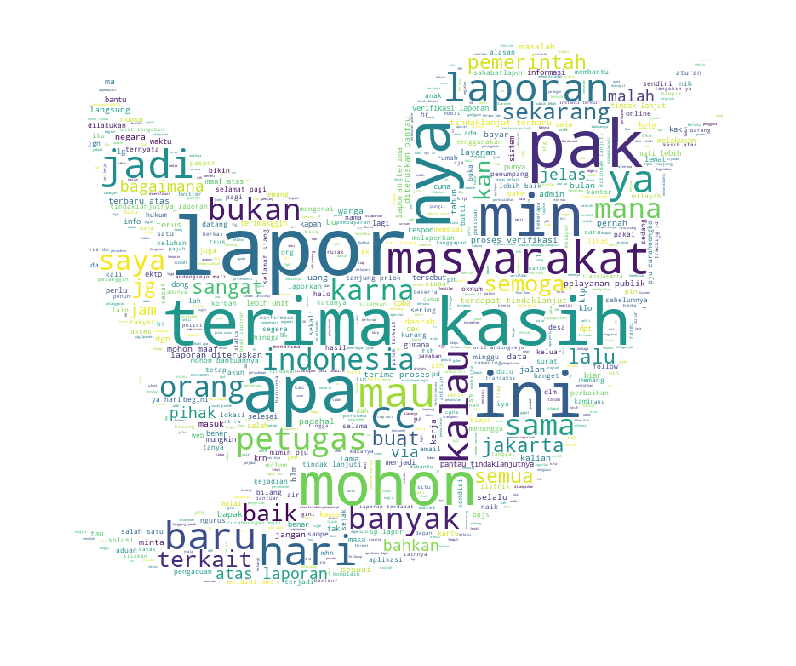

In [30]:
plt.figure(figsize=(28,12))
plt.axis('off')
plt.imshow(wc)
plt.show()

## Melihat Kata yang Sering Muncul dalam Tweet

In [31]:
# load package
from nltk.probability import FreqDist

Menggunakan FreqDist untuk melakukan count word dan membuatnya menjadi dataframe:

In [32]:
df_count_word = pd.DataFrame({
    'kata':list(FreqDist(text_only).keys()),
    'jumlah':list(FreqDist(text_only).values())
}).sort_values(by='jumlah', ascending=False)

In [33]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(
    x=df_count_word.head(20)['kata'],
    y=df_count_word.head(20)['jumlah'],
    marker_color='#008ba3' # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Kata paling sering muncul', xaxis_title='Kata', yaxis_title='Frekuensi')

## Jumlah kata masing-masing Keyword dalam tweet

In [34]:
keyword = ['jalan',
 'ktp',
 'air',
 'bersih',
 'sampah',
 'lubang',
 'saluran',
 'macet',
 'selokan',
 'kotor',
 'mampet',
 'banjir']

In [35]:
count_key = []
for key in keyword:
    count = df['tweet'].str.lower().str.contains(key).sum()
    count_key.append(count)

In [36]:
df_keyword = pd.DataFrame({
    'keyword':keyword,
    'jumlah':count_key
}).sort_values(by='jumlah', ascending=False)

In [37]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(
    x=df_keyword['keyword'],
    y=df_keyword['jumlah'],
    marker_color='#008ba3' # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Jumlah keyword dalam tweet', xaxis_title='Kata', yaxis_title='Frekuensi')

## Wordcloud dan frekuensi kata tiap jam masing-masing keyword

Mempersiapkan fungsi yang akan digunakan untuk membuat wordcloud:

In [38]:
def concate_string(df):
    hasil = ''
    for tweet in df['tweet']:
        hasil += ' ' + tweet
    hasil = hasil.strip()
    return hasil

def clean_text(text):
    list_words = text.split()
    list_no_link = [element for element in list_words if '.com/' not in element]
    list_no_link = [element for element in list_no_link if '://' not in element]
    list_lower = [element.lower() for element in list_no_link]
    list_text = [element for element in list_lower if '@' not in element]
    list_no_stopwords = [element for element in list_text if element not in stopwords]
    hasil_text = ' '.join(list_no_stopwords)
    hasil_clean = re.sub('[^a-zA-Z]', ' ', hasil_text)
    text_only = hasil_clean.split()
    text_clean = ' '.join(text_only)
    return text_clean

def create_word_cloud(text):
    wc = WordCloud(background_color="white", max_words=1000, width=700, height=400).generate(text)
    
    plt.figure(figsize=(25,7))
    plt.axis('off')
    plt.imshow(wc)
    plt.show()

Mendefinisikan hour, minute, dan second dari data tweet:

In [39]:
df['hour'] = df['time'].str.split(':').apply(lambda ser: int(ser[0]))

In [40]:
df['minute'] = df['time'].str.split(':').apply(lambda ser: int(ser[1]))

In [41]:
df['second'] = df['time'].str.split(':').apply(lambda ser: int(ser[2]))

Mengganti hour, minute, dan second dari date menjadi waktu yang telah didefinisikan di atas:

In [42]:
def change_datetime(df):
    return df['date'].replace(hour=df['hour'], minute=df['minute'], second=df['second'])

In [43]:
df['datetime'] = df[['date', 'hour', 'minute', 'second']].apply(change_datetime, axis=1)

### Jalan

In [44]:
df_jalan = df[df['tweet'].str.contains('jalan')]
jalan_text = concate_string(df_jalan)

In [45]:
jalan_text_clean = clean_text(jalan_text)

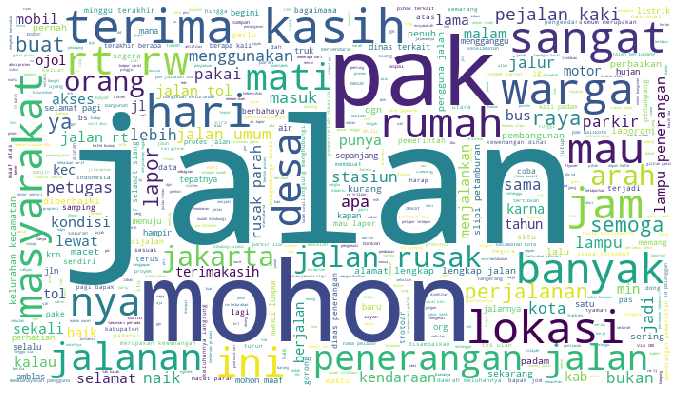

In [46]:
create_word_cloud(jalan_text_clean)

In [47]:
resample_jalan_hourly = df_jalan.resample('H', on='datetime').count()['tweet']

In [48]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=resample_jalan_hourly.index, y=resample_jalan_hourly.values,
                         line_color='#008ba3'))

fig.update_layout(title_text='Trend Tweet kata "Jalan" Lapor! per jam',
                  xaxis_title='Waktu(dalam jam)',
                  yaxis_title='Frekuensi',
                  width=900,
                  height=700,
                  xaxis_rangeslider_visible=True)
fig.layout.plot_bgcolor = '#f2f6fc'
fig.show()

### KTP

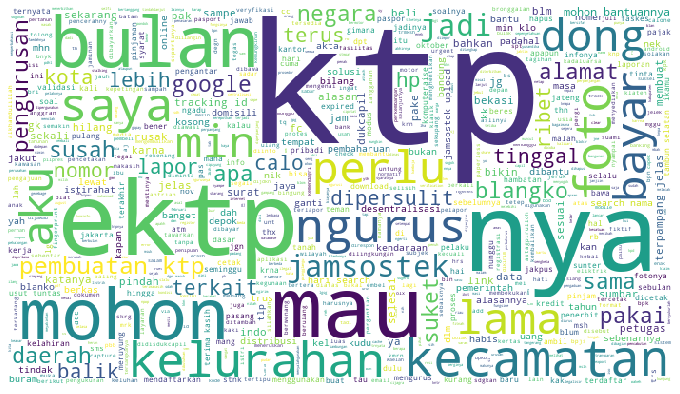

In [49]:
df_ktp = df[df['tweet'].str.contains('ktp')]
text = concate_string(df_ktp)
text_clean = clean_text(text)
create_word_cloud(text_clean)

In [50]:
def resample_hourly_graph(resample_hourly, title):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=resample_hourly.index, y=resample_hourly.values,
                             line_color='#008ba3'))

    fig.update_layout(title_text=f'Trend kata {title} dalam tweet Lapor! per jam',
                      xaxis_title='Waktu(dalam jam)',
                      yaxis_title='Frekuensi',
                      width=900,
                      height=700,
                      xaxis_rangeslider_visible=True)
    fig.layout.plot_bgcolor = '#f2f6fc'
    fig.show()

In [51]:
resample_hourly = df_ktp.resample('H', on='datetime').count()['tweet']
resample_hourly_graph(resample_hourly, title='ktp')

### Air

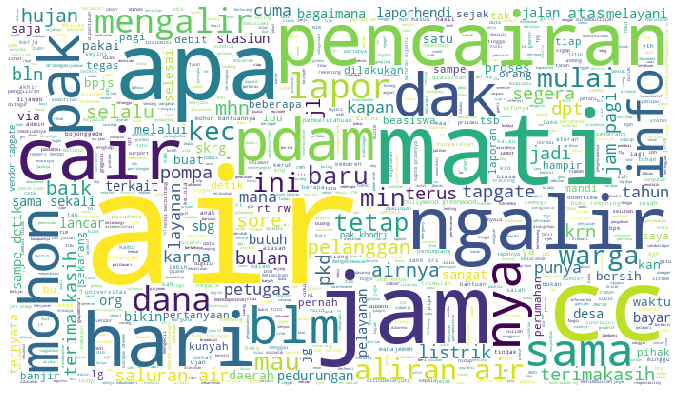

In [52]:
df_air = df[df['tweet'].str.contains('air')]
text = concate_string(df_air)
text_clean = clean_text(text)
create_word_cloud(text_clean)

In [53]:
resample_hourly = df_air.resample('H', on='datetime').count()['tweet']
resample_hourly_graph(resample_hourly, title='air')

### Bersih

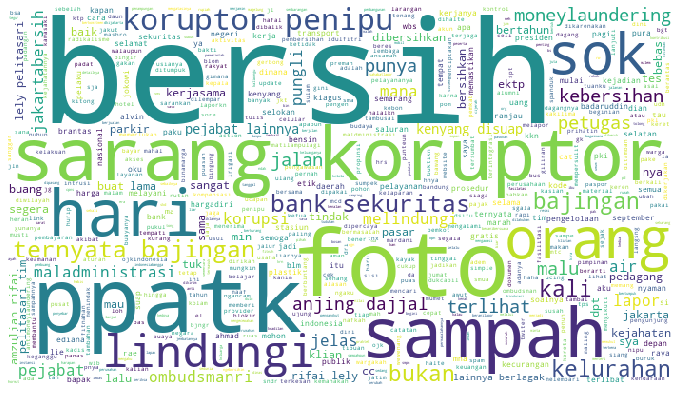

In [54]:
df_bersih = df[df['tweet'].str.contains('bersih')]
text = concate_string(df_bersih)
text_clean = clean_text(text)
create_word_cloud(text_clean)

In [55]:
resample_hourly = df_bersih.resample('H', on='datetime').count()['tweet']
resample_hourly_graph(resample_hourly, title='bersih')

### Sampah

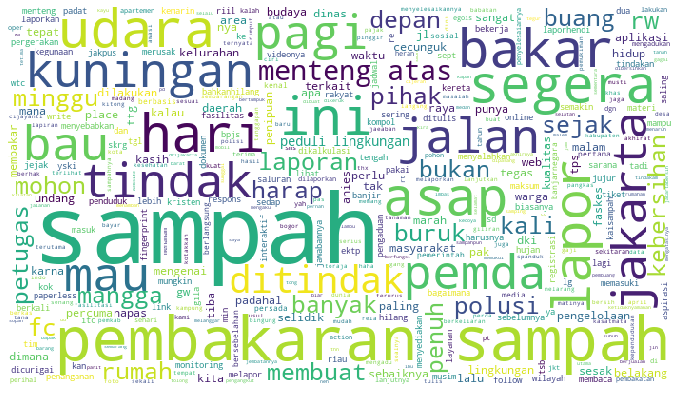

In [56]:
df_sampah = df[df['tweet'].str.contains('sampah')]
text = concate_string(df_sampah)
text_clean = clean_text(text)
create_word_cloud(text_clean)

In [57]:
resample_hourly = df_sampah.resample('H', on='datetime').count()['tweet']
resample_hourly_graph(resample_hourly, title='sampah')

### Saluran, dll

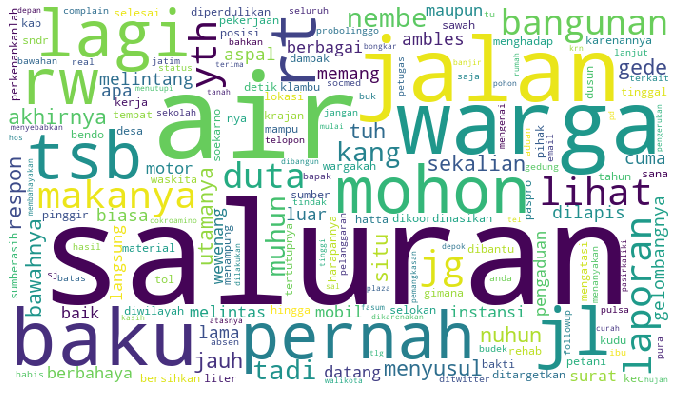

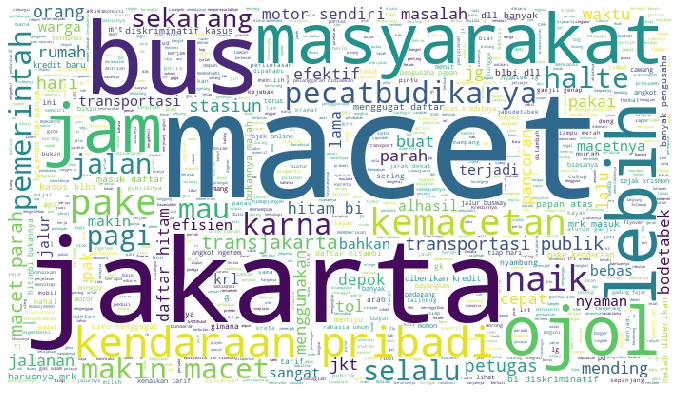

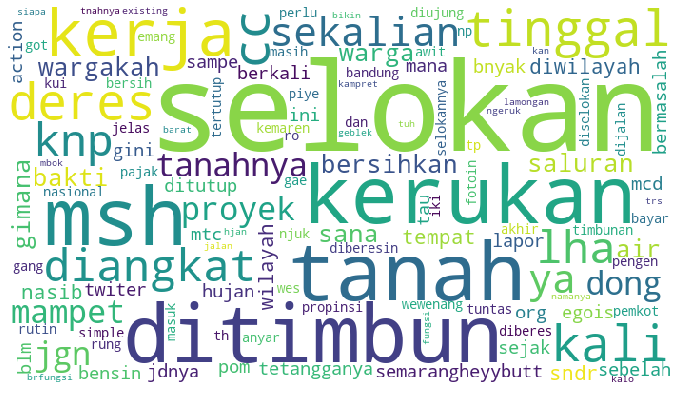

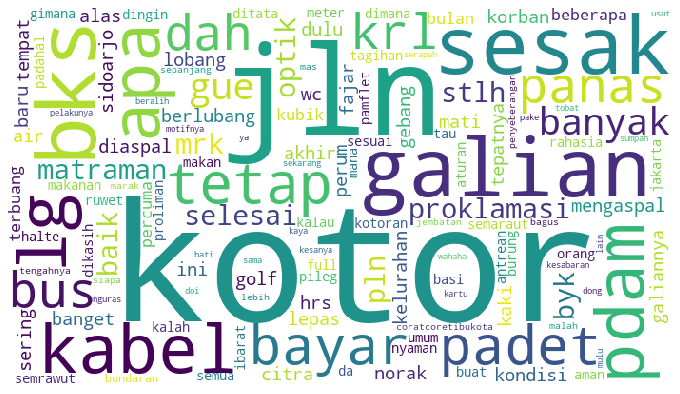

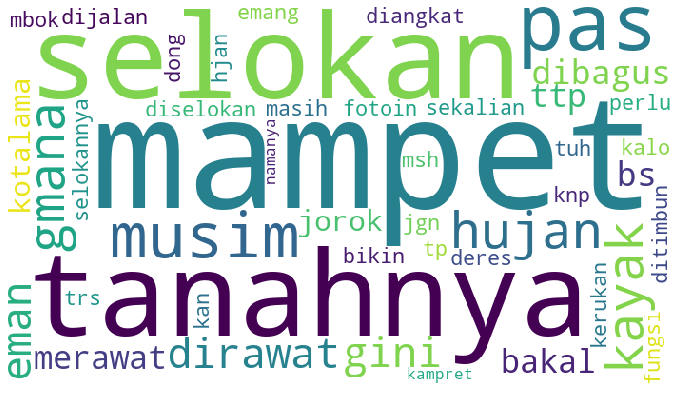

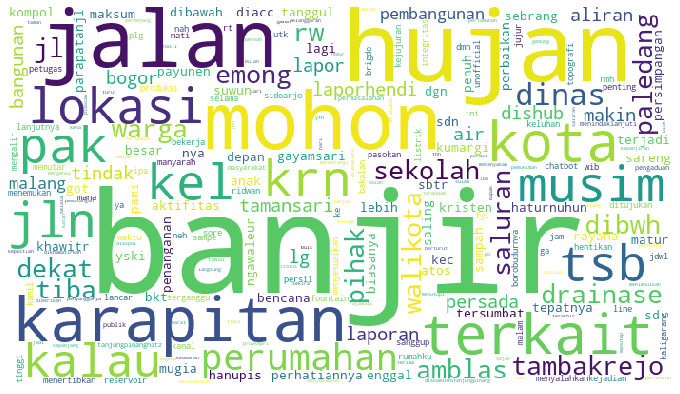

In [58]:
for key in keyword[6:]:
    df_x = df[df['tweet'].str.contains(key)]
    text = concate_string(df_x)
    text_clean = clean_text(text)
    create_word_cloud(text_clean)
    
    resample_hourly = df_x.resample('H', on='datetime').count()['tweet']
    resample_hourly_graph(resample_hourly, title=key)

## Trend Waktu

In [59]:
df['weekday'] = df['date'].dt.weekday

In [60]:
weekday_count = df.groupby('weekday').count()['tweet']

In [61]:
weekday_count.index = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

In [62]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(
    x=weekday_count.index,
    y=weekday_count.values,
    marker_color='#008ba3' # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Aktivitas Berdasarkan Hari', xaxis_title='Hari', yaxis_title='Frekuensi', width=600, height=400)

In [63]:
def group_hour(ser):
    if (ser >= 0 and ser < 6):
        return '00:00-05:59'
    elif (ser >= 6 and ser < 12):
        return '06:00-11:59'
    elif (ser >= 12 and ser < 18):
        return '12:00-17.59'
    else:
        return '18:00-23:59'

In [64]:
df['group_hour'] = df['hour'].apply(group_hour)

In [65]:
group_hour = df.groupby('group_hour').count()['tweet']

In [66]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(
    x=group_hour.index,
    y=group_hour.values,
    marker_color='#008ba3' # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Aktivitas Per 6 Jam', yaxis_title='Frekuensi', width=600, height=400)